In this notebook, different BO-based methods are compared using the optimized ScopeBO settings or related settings

In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join('..','..','..')))
from pathlib import Path
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from Code.benchmark import Benchmark
from Code.predictor import ScopeBO
wdir = Path(".")
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import colorsys


# Define custom colormaps
doyle_colors = ["#CE4C6F","#1561C2", "#188F9D","#C4ADA2","#515798", "#CB7D85", "#A9A9A9"]
# extension of palette with lighter and darker versions
def adjust_lightness(color, factor=1.2):
    """
    Function to make colors lighter (factor > 1) or darker (factor < 1).
    """
    r, g, b = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    l = max(0, min(1, l * factor))
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return mcolors.to_hex((r, g, b))

lighter = [adjust_lightness(c, 1.2) for c in doyle_colors]
darker  = [adjust_lightness(c, 0.7) for c in doyle_colors]
all_colors = doyle_colors + darker[::-1] + lighter[::-1] 

# Save the categorical colormap
cat_cmap = ListedColormap(all_colors, name="Doyle_cat")
plt.colormaps.register(cat_cmap)

# Define colors for interpolation
colors = [doyle_colors[1],"#FFFFFFD1",doyle_colors[0]]
cont_cmap = LinearSegmentedColormap.from_list("Doyle_cont", colors)
# save the continuous colormap
plt.colormaps.register(cont_cmap)

# General plt parameters
plt.rcParams.update({
    "axes.titlesize": 20,        # Subplot title
    "axes.labelsize": 16,        # X and Y labels
    "figure.titlesize": 24,      # Suptitle
    "xtick.labelsize": 14,       # X tick labels
    "ytick.labelsize": 14,       # Y tick labels
    "legend.fontsize": 14,       # Legend text
    "legend.title_fontsize": 14  # Legend titles
})

Run the scopes

In [2]:
# define a running variable with the datasets
datasets = ["high","medium","low"]
# load the bounds for the normalization
df_bounds = pd.read_csv("./../0_Data/Datasets/Datasets_Hyperpar_Opt/bounds.csv",index_col=0)
# define a function to extract the relevant bounds in a format suitable for the Benchmark class
def get_bounds(dset):
    bounds = {}
    # get the metrics for the rate objective
    bounds["rate"] = (df_bounds.loc["obj_max",dset],df_bounds.loc["obj_min",dset])
    # get the metrics for the vendi score
    bounds["vendi"] = (df_bounds.loc["vendi_max",dset],df_bounds.loc["vendi_min",dset])

    return bounds



In [3]:
# for dset in datasets:
#     acq_fct = ["ei","random-selection","greedy","explorative"]
#     for acq in acq_fct:
#         if acq == "ei":
#             acq_label = "balanced"
#         elif acq == "random-selection":
#             acq_label = "random"
#         else:
#             acq_label = acq
#         for pruning in [False,True]:
#             if pruning:
#                 pruning_label = "with-pruning"
#                 pruning_fraction = 13
#             else:
#                 pruning_label = "no-pruning"
#                 pruning_fraction = 0
#             Benchmark().collect_data(
#                 filename_labelled = f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/data-{dset}.csv", 
#                 name_results = f"./Results_Data/{dset}_dataset/{acq}_{pruning_label}",
#                 objectives=['rate'],
#                 budget=27,
#                 batches=[3],
#                 Vendi_pruning_fractions = [pruning_fraction],
#                 seeds = 20,
#                 acquisition_function_mode= acq_label,
#                 pruning_metric = "vendi_batch",
#                 init_sampling_method="random")

In [4]:
# # carry out selections similar to the way humans conventionally select scopes (greedy + 5% pruning)
# for dset in datasets:
#     Benchmark().collect_data(
#         filename_labelled = f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/data-{dset}.csv", 
#         name_results = f"./Results_Data/{dset}_dataset/human-like-acq",
#         objectives=['rate'],
#         budget=27,
#         batches=[3],
#         Vendi_pruning_fractions = [5],
#         seeds = 20,
#         acquisition_function_mode= "greedy",
#         pruning_metric = "vendi_batch",
#         init_sampling_method="random")

Get the results

In [5]:
print("Vendi scores for the full datasets for comparison:\n")
full_Vendis = {}
for dset in datasets:
    full_Vendi = ScopeBO().get_vendi_score(filename=f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/data-{dset}.csv",
                                         objectives=["rate"])
    print(f"Vendi score for full dataset {dset}:", full_Vendi)
    full_Vendis[dset] = full_Vendi

Vendi scores for the full datasets for comparison:

Vendi score for full dataset high: 3.4522644307093775
Vendi score for full dataset medium: 3.012240474425957
Vendi score for full dataset low: 3.127006484350853


In [6]:
print("Average rates for the full datasets for comparison:\n")
full_av_rates = {}
for dset in datasets:
    df_labelled = pd.read_csv(f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/data-{dset}.csv",index_col = 0)
    full_av_rate = df_labelled["rate"].mean()
    print(f"Average rate for full dataset {dset}:", full_av_rate)
    full_av_rates[dset] = full_av_rate

Average rates for the full datasets for comparison:

Average rate for full dataset high: 0.42490642560610536
Average rate for full dataset medium: 1.2390807731233493
Average rate for full dataset low: 2.153299702863298


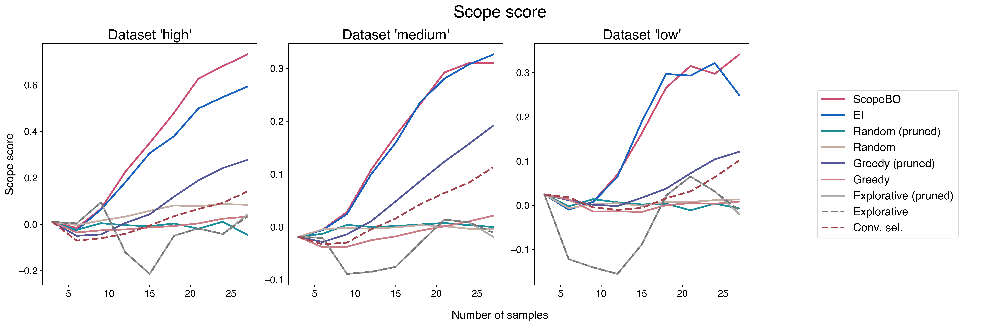

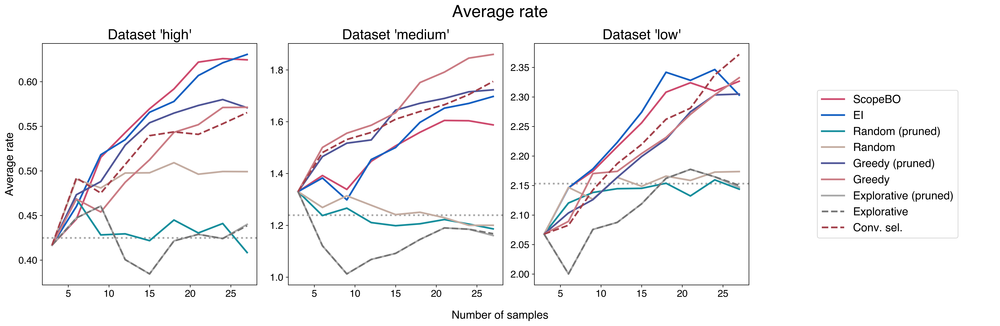

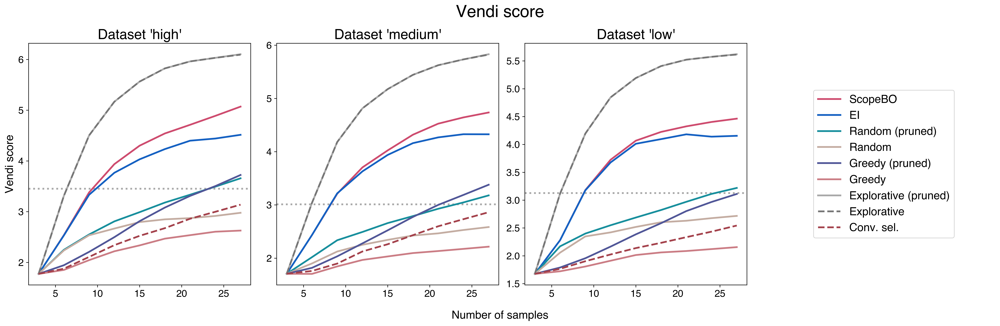

In [7]:
dfs_combined = {}
palette = sns.color_palette("Doyle_cat", n_colors=len(all_colors))

for type_results in ["Scope","Objective","Vendi"]:
    # Initialize the figure
    fig, axes = plt.subplots(1,4,figsize=(20,6.5),dpi=600)
    fig.supxlabel("Number of samples",fontsize=16)
    if type_results == "Objective":
        fig.suptitle("Average rate",fontsize=24)

    else:
        fig.suptitle(f"{type_results} score",fontsize=24)
    for i,dset in enumerate(datasets):
        dfs = {}
        for acq in ["EI","Random","Greedy","Explorative","Conv. sel."]:
            if acq.lower() == "random":
                acq_label = "random-selection"
            elif acq.lower() == "conv. sel.":
                acq_label = "human-like-acq"
            else:
                acq_label = acq.lower()
            for pruning in [True,False]:
                if acq == "Conv. sel.":
                    pruning_label = ""
                else:
                    if pruning:
                        pruning_label = "_with-pruning"
                        pruning_flag = "with"
                    else:
                        pruning_label = "_no-pruning"
                        pruning_flag = "without"
                dfs_progress = Benchmark().progress_plot(budget=27, type_results= type_results,
                                        name_results=f"Results_Data/{dset}_dataset/{acq_label}{pruning_label}",
                                        bounds=get_bounds(dset),show_plot=False)
                dfs[acq+pruning_label] = dfs_progress["means"]
        df_combined = pd.concat(dfs,axis=1)
        df_combined.columns = [multiindex[0] for multiindex in df_combined.columns]
        df_combined.rename(columns={"EI_with-pruning":"ScopeBO"},inplace=True)
        df_combined = df_combined[["ScopeBO"] + [col for col in df_combined.columns if col != "ScopeBO"]]
        label_dict = {col: col for col in df_combined.columns}
        for key,val in label_dict.items():
            if "_no-pruning" in val:
                label_dict[key] = val.split("_")[0]
            elif "with-pruning" in val:
                label_dict[key] = val.split("_")[0] + " (pruned)"
        df_combined.rename(columns=label_dict,inplace=True)
        dfs_combined[f"{dset}_{type_results}"] = df_combined
        for j,col in enumerate(df_combined.columns):
            style = '-' if j <= 6 else '--' if j <= 13 else ':'
            axes[i].plot(df_combined.index,df_combined[col], label = col, color=all_colors[j],
                         linestyle=style, linewidth=2.5)
            if type_results == "Vendi":
                axes[i].axhline(y=full_Vendis[dset], color=all_colors[6], linestyle=':', linewidth=2.5, zorder=1)
            if type_results == "Objective":
                axes[i].axhline(y=full_av_rates[dset], color=all_colors[6], linestyle=':', linewidth=2.5, zorder=1)
        if type_results == "Objective":
            axes[0].set_ylabel(f"Average rate",fontsize=16)
        else:
            axes[0].set_ylabel(f"{type_results} score",fontsize=16)
        axes[i].set_title(f"Dataset '{dset}'")
        if i == 0:
            handles_collected, labels_collected = axes[i].get_legend_handles_labels()
    axes[3].axis('off')
    axes[3].legend(handles=handles_collected, labels=labels_collected,
                                                        fontsize=16, loc='center')
    plt.tight_layout()
    plt.show()

ScopeBO as well as regular BO and explorative selection achieve a higher Vendi score than the one obtained if the whole dataset was evaluated. This highlights that ScopeBO leads to a good representation of underpresented groups in the selected scope. Other algorithms, including conventional selection, lead to an underrepresentation of such groups. Notably, a random selection also gave a Vendi score a bit below the value for the whole dataset which indicates further highlights the amount of diversity that ScopeBO achieves in a limited number of experiments.

In [8]:
final_scores = {}
norm_scores = {}
df_scopebo = pd.DataFrame(np.nan,index=["Scope score","Average rate","Vendi score"],columns=datasets)
# get the final metric for the datasets
for dset in datasets:
    final_scope = pd.DataFrame(np.nan, index = ["Scope","Objective","Vendi"], columns = dfs_combined["high_Scope"].columns)
    for idx in final_scope.index:
        for col in final_scope.columns:
            final_scope.loc[idx,col] = dfs_combined[f"{dset}_{idx}"][col].iloc[-1]
    df_scopebo[dset] = final_scope["ScopeBO"].to_list()
    final_scores[dset] = final_scope
    # Normalize each metric
    final_scope = final_scope.apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=1)
    norm_scores[dset] = final_scope

In [9]:
print("Final scores in the high dataset:")
final_scores["high"].T.applymap(lambda x: round(x,3))

Final scores in the high dataset:


,Scope,Objective,Vendi
ScopeBO,0.730,0.624,5.070
EI,0.592,0.631,4.515
Random (pruned),-0.045,0.408,3.658
Random,0.084,0.499,2.978
Greedy (pruned),0.277,0.571,3.723
Greedy,0.033,0.571,2.628
Explorative (pruned),0.040,0.440,6.102
Explorative,0.033,0.439,6.094
Conv. sel.,0.141,0.565,3.138


In [10]:
print("Final scores in the medium dataset:")
final_scores["medium"].T.applymap(lambda x: round(x,3))

Final scores in the medium dataset:


,Scope,Objective,Vendi
ScopeBO,0.311,1.588,4.736
EI,0.326,1.697,4.327
Random (pruned),-0.000,1.186,3.179
Random,-0.005,1.200,2.585
Greedy (pruned),0.191,1.723,3.379
Greedy,0.021,1.860,2.216
Explorative (pruned),-0.019,1.161,5.830
Explorative,-0.011,1.168,5.823
Conv. sel.,0.113,1.756,2.863


In [11]:
print("Final scores in the low dataset:")
final_scores["low"].T.applymap(lambda x: round(x,3))

Final scores in the low dataset:


,Scope,Objective,Vendi
ScopeBO,0.341,2.327,4.463
EI,0.249,2.303,4.155
Random (pruned),-0.007,2.144,3.219
Random,0.013,2.174,2.717
Greedy (pruned),0.121,2.305,3.111
Greedy,0.008,2.333,2.156
Explorative (pruned),-0.020,2.147,5.620
Explorative,-0.011,2.150,5.615
Conv. sel.,0.102,2.372,2.544


In [12]:
print("Final results for ScopeBO:")
df_scopebo

Final results for ScopeBO:


,high,medium,low
Scope score,0.730313,0.310601,0.341009
Average rate,0.624466,1.587776,2.326597
Vendi score,5.070357,4.736154,4.463113


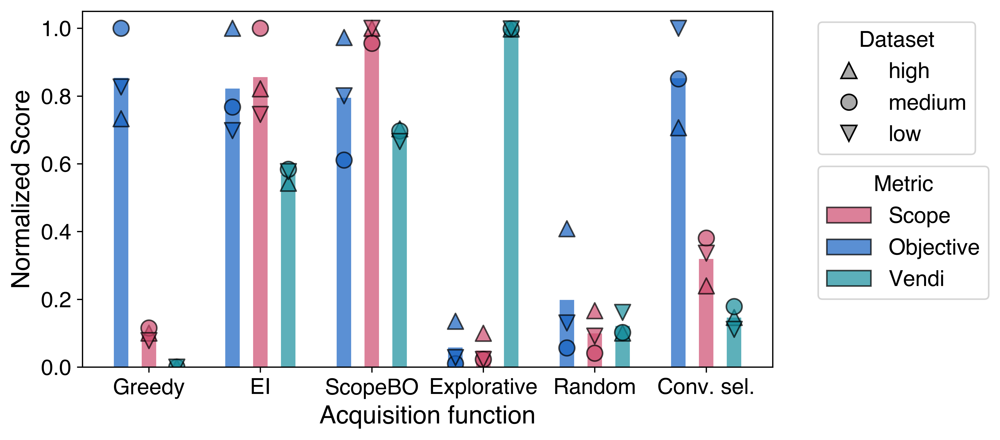

In [25]:
# make a summary plot

# for plotting, restrict to the most relevant methods
for dset in datasets:
    norm_scores[dset] = norm_scores[dset][["Greedy","EI","ScopeBO","Explorative","Random","Conv. sel."]]
records = []
for dataset_name, df in norm_scores.items():
    for idx in df.index:
        for metric in df.columns:
            records.append({
                'Dataset': dataset_name,
                "Acq. Fct.": metric,
                "Metric": idx,
                'Score': df.loc[idx, metric]
            })

long_df = pd.DataFrame(records)
shift = 0.25
offsets = {'Scope': 0, 'Objective': -shift, 'Vendi': shift}
long_df['XOffset'] = long_df["Metric"].map(offsets)

# Positions for each metric
metrics = list(norm_scores["high"].columns)
x_pos_map = {metric: i for i, metric in enumerate(metrics)}
long_df['XBase'] = long_df["Acq. Fct."].map(x_pos_map)
long_df['X'] = long_df['XBase'] + long_df['XOffset']

# Plotting
plt.figure(figsize=(9, 4),dpi=600)
markers = {'high': '^', 'medium': 'o', 'low': 'v'}

cmap = plt.get_cmap('Doyle_cat')

# Get the first three colors from the colormap
colors_list = [cmap(i) for i in range(3)]

# Now assign them in your dictionary
colors = {
    'Scope': colors_list[0],
    'Objective': colors_list[1],
    'Vendi': colors_list[2],
}
# colors = {'Scope': 'blue', 'Objective': 'green', 'Vendi': 'orange'}

# Plot each combination of metric and dataset
for dataset in norm_scores.keys():
    for idx in norm_scores["high"].index:
        subset = long_df[(long_df['Dataset'] == dataset) & (long_df["Metric"] == idx)]
        plt.scatter(
            subset['X'], 
            subset['Score'], 
            marker=markers[dataset],
            color=colors[idx],
            s=100,
            edgecolor='k',
            linewidths=1,
            alpha=0.7
        )

# Legend for Dataset (marker)
dataset_legend = [
    Line2D([0], [0], marker=markers[name], color='w', label=name,
           markerfacecolor=all_colors[6], markeredgecolor='k', markersize=10)
    for name in markers
]

# Legend for metric (color)
index_legend = [
    Patch(facecolor=colors[name], edgecolor='k', label=name, alpha = 0.7)
    for name in colors
]

# Add the legends
legend1 = plt.legend(handles=dataset_legend, title='Dataset', loc='upper left', bbox_to_anchor=(1.05, 1))
legend2 = plt.legend(handles=index_legend, title='Metric', loc='lower left', bbox_to_anchor=(1.05, 0.16))

plt.gca().add_artist(legend1)  # Add the first legend back after second one replaces it
plt.xticks(ticks=range(len(metrics)), labels=metrics)
plt.ylabel('Normalized Score')


# calculate the mean metrics
avg_scores = (
    long_df
    .groupby(["Acq. Fct.", "Metric"], as_index=False)['Score']
    .mean()
)

# Map back to X positions using the same offset logic
avg_scores['XBase'] = avg_scores["Acq. Fct."].map(x_pos_map)
avg_scores['XOffset'] = avg_scores["Metric"].map(offsets)
avg_scores['X'] = avg_scores['XBase'] + avg_scores['XOffset']

# barplot for the mean values
bar_width = 0.13
for idx, color in colors.items():
    subset = avg_scores[avg_scores["Metric"] == idx]
    plt.bar(
        subset['X'], 
        subset['Score'], 
        width=bar_width, 
        color=color, 
        alpha=0.7, 
        label=f'{idx} avg',
        zorder=0
    )

plt.xlabel("Acquisition function")
plt.tight_layout()
plt.show()


In [14]:
print("Averaged normalized scope scores:")
avg_scores.sort_values(by="Score",inplace=True,ascending=False)
avg_scores.loc[avg_scores["Metric"]=="Scope"][["Acq. Fct.","Score"]]

Averaged normalized scope scores:


,Acq. Fct.,Score
25,ScopeBO,0.985134
4,EI,0.855857
16,Greedy (pruned),0.471844
1,Conv. sel.,0.318977
19,Random,0.099698
13,Greedy,0.098070
7,Explorative,0.048758
10,Explorative (pruned),0.036512
22,Random (pruned),0.029598


* ScopeBO highest scope score in two out of three cases, almost tied in the third case
* ScopeBO and EI both break upper rate bounds for high dataset
* ScopeBO higher diversity than EI at almost the same average objective

### Statistical testing

To test for statistically significant differences between the selection methods, we carried out a Friedman test for each dataset to test if the scope scores are similar between the methods.

Note that we can not carry out these tests for clustering-based methods as they are deterministic and do not provide a distribution of scope score results.

In [15]:
# read in the data
all_scope_scores = {}
all_vendi_scores = {}
all_av_rates = {}
renaming = {"Greedy_no-pruning":"Greedy",
            "Greedy_with-pruning":"Greedy (pruned)",
            "EI_no-pruning":"EI",
            "EI_with-pruning":"ScopeBO",
            "Random_no-pruning":"Random",
            "Random_with-pruning":"Random (pruned)",
            "Explorative_no-pruning":"Explorative",
            "Explorative_with-pruning":"Explorative (pruned)",
            "Conv. selection":"Conv. selection"}

for scope_type in ["scope","vendi","rate"]:
    for dset in datasets:
        scores = pd.DataFrame(np.nan, index=list(renaming.values()), columns=list(range(20)))
        for acq in ["EI","Random","Greedy","Explorative","Conv. selection"]:
            if acq.lower() == "random":
                acq_label = "random-selection"
            elif acq.lower() == "conv. selection":
                acq_label = "human-like-acq"
            else:
                acq_label = acq.lower()
            for pruning in [True,False]:
                if acq.lower() == "conv. selection" and pruning:
                    continue  # only read the human-like acq once (no pruning distinction)
                if pruning:
                    pruning_label = "_with-pruning"
                else:
                    pruning_label = "_no-pruning"
                if acq.lower() == "conv. selection":
                    pruning_label = ""
                _, dict_data = Benchmark().get_metric_overview(bounds = get_bounds(dset), budget = 27,
                                                    name_results=f"Results_Data/{dset}_dataset/{acq_label}{pruning_label}", 
                                                    type_results=scope_type)
                for seed_dict in dict_data.values():
                    for seed, df in seed_dict.items():
                        scores.loc[renaming[acq+pruning_label], seed] = df.loc[8,scope_type]
        if scope_type == "scope":
            all_scope_scores[dset] = scores
        elif scope_type == "vendi":
            all_vendi_scores[dset] = scores
        elif scope_type == "rate":
            all_av_rates[dset] = scores

In [16]:
from scipy.stats import friedmanchisquare
print("Friedman test results for Scope scores:\n")
for dset in datasets:
    print("Dataset", dset)
    res = friedmanchisquare(*all_scope_scores[dset].values)
    print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)
    print("\n")

Friedman test results for Scope scores:

Dataset high
Friedman statistic: 85.99076018479637 
p-value: 3.0206223506389688e-15


Dataset medium
Friedman statistic: 108.30252100840345 
p-value: 8.498744256688796e-20


Dataset low
Friedman statistic: 43.06968933669186 
p-value: 8.522790100624848e-07




In [17]:
print("Friedman test results for Vendi scores:\n")
for dset in datasets:
    print("Dataset", dset)
    res = friedmanchisquare(*all_vendi_scores[dset].values)
    print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)
    print("\n")

Friedman test results for Vendi scores:

Dataset high
Friedman statistic: 148.96934061318782 
p-value: 3.2164318484094447e-28


Dataset medium
Friedman statistic: 151.5899159663866 
p-value: 9.135611995302509e-29


Dataset low
Friedman statistic: 154.43931121377577 
p-value: 2.3224203774909175e-29




In [18]:
print("Friedman test results for average rates:\n")
for dset in datasets:
    print("Dataset", dset)
    res = friedmanchisquare(*all_av_rates[dset].values)
    print("Friedman statistic:", res.statistic, "\np-value:", res.pvalue)
    print("\n")

Friedman test results for average rates:

Dataset high
Friedman statistic: 60.24023519529608 
p-value: 4.1816100776479967e-10


Dataset medium
Friedman statistic: 105.1361344537815 
p-value: 3.7931900848240743e-19


Dataset low
Friedman statistic: 36.41981528127633 
p-value: 1.4709573418265356e-05




Differences between the selection methods were found (null hypothesis rejected as p < 5%) for all metrics. Thus, we continue with two-sided Wilcoxon tests between ScopeBO and the other methods, controlling for the initiation seed, while correcting for multiple comparisons with the Holm-Bonferroni method.

In [19]:
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import multipletests

def wilcoxon_tests(data):
    """
    Function for performing pairwise Wilcoxon signed-rank tests 
    comparing ScopeBO to each other method, with Holm-Bonferroni correction.
    """
    for dset in datasets:
        print(f"Dataset: {dset}")
        df = data[dset]
        methods = df.index.tolist()
        reference = methods[3]  # ScopeBo is the 4th method in index of the df

        comparisons = []
        p_values = []

        for method in methods:
            if method == reference:
                continue
            
            # two-sided Wilcoxon of ScopeBo versus the other method
            stat, p = wilcoxon(
                df.loc[reference],
                df.loc[method],
                alternative= "two-sided"
            )
            
            comparisons.append(method)
            p_values.append(p)

        # Holm-Bonferroni correction
        reject, pvals_corrected, _, _ = multipletests(
            p_values,
            alpha=0.05,
            method='holm'
        )
        results = pd.DataFrame({
            "Comparison": comparisons,
            "Corrected p-value": pvals_corrected,
            "ScopeBO higher?": [np.mean(df.loc[reference].values) > np.mean(df.loc[comp].mean()) for comp in comparisons],
            "Different?": reject,
        })

        print(f"Reference method: {reference}")
        display(results)
        print("\n")

In [20]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Scope score):\n")
wilcoxon_tests(all_scope_scores)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Scope score):

Dataset: high
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,0.000015,True,True
1,Greedy (pruned),0.000523,True,True
2,EI,0.004860,True,True
3,Random,0.000015,True,True
4,Random (pruned),0.000015,True,True
5,Explorative,0.000029,True,True
6,Explorative (pruned),0.000029,True,True
7,Conv. selection,0.000029,True,True




Dataset: medium
Reference method: ScopeBO


Exact p-value calculation does not work if there are zeros. Switching to normal approximation.


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,0.000015,True,True
1,Greedy (pruned),0.001701,True,True
2,EI,0.493901,False,False
3,Random,0.000015,True,True
4,Random (pruned),0.000015,True,True
5,Explorative,0.000015,True,True
6,Explorative (pruned),0.000015,True,True
7,Conv. selection,0.000015,True,True




Dataset: low
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,0.000504,True,True
1,Greedy (pruned),0.016617,True,True
2,EI,0.089695,True,False
3,Random,0.005070,True,True
4,Random (pruned),0.001307,True,True
5,Explorative,0.000935,True,True
6,Explorative (pruned),0.000935,True,True
7,Conv. selection,0.003403,True,True


In [21]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Vendi score):\n")
wilcoxon_tests(all_vendi_scores)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (Vendi score):

Dataset: high
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,0.000015,True,True
1,Greedy (pruned),0.000015,True,True
2,EI,0.000063,True,True
3,Random,0.000015,True,True
4,Random (pruned),0.000015,True,True
5,Explorative,0.000015,False,True
6,Explorative (pruned),0.000015,False,True
7,Conv. selection,0.000015,True,True




Dataset: medium
Reference method: ScopeBO


Exact p-value calculation does not work if there are zeros. Switching to normal approximation.


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,0.000015,True,True
1,Greedy (pruned),0.000015,True,True
2,EI,0.000625,True,True
3,Random,0.000015,True,True
4,Random (pruned),0.000015,True,True
5,Explorative,0.000015,False,True
6,Explorative (pruned),0.000015,False,True
7,Conv. selection,0.000015,True,True




Dataset: low
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,0.000015,True,True
1,Greedy (pruned),0.000015,True,True
2,EI,0.000027,True,True
3,Random,0.000015,True,True
4,Random (pruned),0.000015,True,True
5,Explorative,0.000015,False,True
6,Explorative (pruned),0.000015,False,True
7,Conv. selection,0.000015,True,True


In [22]:
print("Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (average rate):\n")
wilcoxon_tests(all_av_rates)

Two-sided Wilcoxon signed-rank tests comparing ScopeBO to other methods (average rate):

Dataset: high
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,0.379257,True,False
1,Greedy (pruned),0.379257,True,False
2,EI,0.701181,False,False
3,Random,0.379257,True,False
4,Random (pruned),0.000031,True,True
5,Explorative,0.000031,True,True
6,Explorative (pruned),0.000031,True,True
7,Conv. selection,0.379257,True,False




Dataset: medium
Reference method: ScopeBO


Exact p-value calculation does not work if there are zeros. Switching to normal approximation.


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,0.019440,False,True
1,Greedy (pruned),0.072468,False,False
2,EI,0.072468,False,False
3,Random,0.000525,True,True
4,Random (pruned),0.000015,True,True
5,Explorative,0.000015,True,True
6,Explorative (pruned),0.000015,True,True
7,Conv. selection,0.040850,False,True




Dataset: low
Reference method: ScopeBO


,Comparison,Corrected p-value,ScopeBO higher?,Different?
0,Greedy,1.000000,False,False
1,Greedy (pruned),1.000000,True,False
2,EI,0.832066,True,False
3,Random,0.347900,True,False
4,Random (pruned),0.002895,True,True
5,Explorative,0.000656,True,True
6,Explorative (pruned),0.000656,True,True
7,Conv. selection,0.707413,False,False


### Print some example scopes

The depicted scopes are the ones with the random seed that gave the most average performance for ScopeBO for the respective dataset.

In [23]:
def find_av_random_seed(name_results, dset, batch_pruning, budget=27):
    """Finds the random seed that give the scope with a scope score closet to the average performance."""

    _, dict_dfs_raw_data = Benchmark.get_metric_overview(bounds=get_bounds(dset),budget=budget,type_results="scope", 
                                name_results=name_results)

    # dict_dfs_raw_data contains the a dict for each batch-pruning 
    # combination which in turn contains a dict of the raw data for the differnt random seeds
    # --> restrict to the relevant data (batch size 2 and no Vendi pruning)
    dfs_raw_data = dict_dfs_raw_data[batch_pruning]

    # collect the scope scores
    # NOTE: the indices are the (zero-indexed) rounds --> round 8 is the full scope of 27 samples
    score_dict = {seed: df.loc[8,"scope"] for seed,df in dfs_raw_data.items()}
    av_score = np.mean(np.array(list(score_dict.values())))

    # calculate the absolute difference to the average score
    score_diff = {seed: abs(score-av_score) for seed,score in score_dict.items()}

    # get the seed that is closest to the average
    av_seed = min(score_diff,key=score_diff.get)

    return av_seed


def get_umap(name_results, hyperpar="balanced_b3_V13", dset="medium", seed = None,figsize=(2.7,2.7), show_colorbar=False):

    if seed is None:
        seed = find_av_random_seed(name_results= name_results,
                            dset = dset, batch_pruning= "_".join(hyperpar.split("_")[1:]))
    print("Depicted seed:",seed)
    data_labelled = pd.read_csv(f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/data-{dset}.csv", index_col =0)
    Benchmark().track_samples(filename_umap=f"./../0_Data/ArI_UMAP_coords_{dset}.csv",
                            filename_data=f"27{hyperpar}_s{seed}.csv",
                            bounds=get_bounds(dset),
                            hide_axis = True, obj_plot_bounds=(data_labelled["rate"].max(),data_labelled["rate"].min()),
                            filename_labelled=f"./../0_Data/Datasets/Datasets_Hyperpar_Opt/data-{dset}.csv",
                            name_results= name_results+ "/raw_data", show_colorbar= show_colorbar,
                            label_round=False, display_cut_samples=False, figsize = figsize, size_scaling = 0.3, dpi=600)
    
    return seed

UMAP for ScopeBO (dataset high):

Depicted seed: 4
Scope score: 0.726
Average rate: 0.600
Vendi score: 5.435


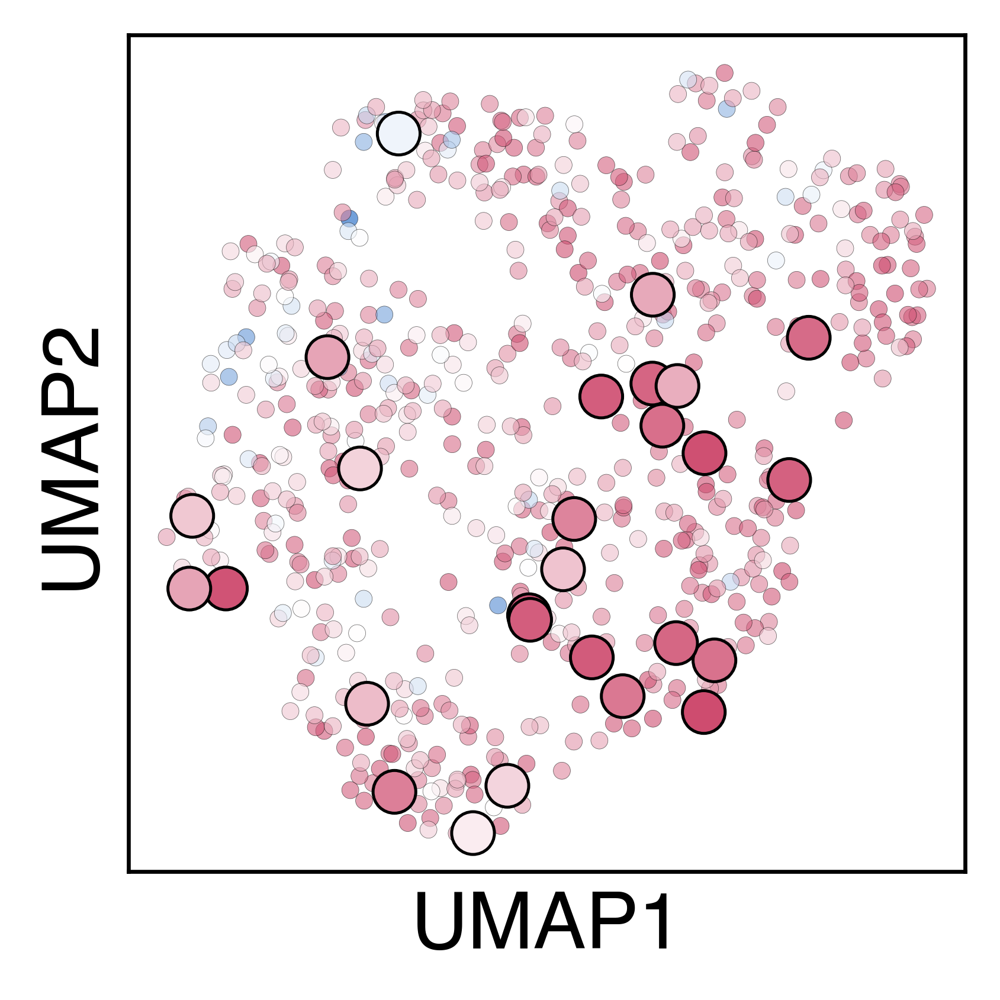

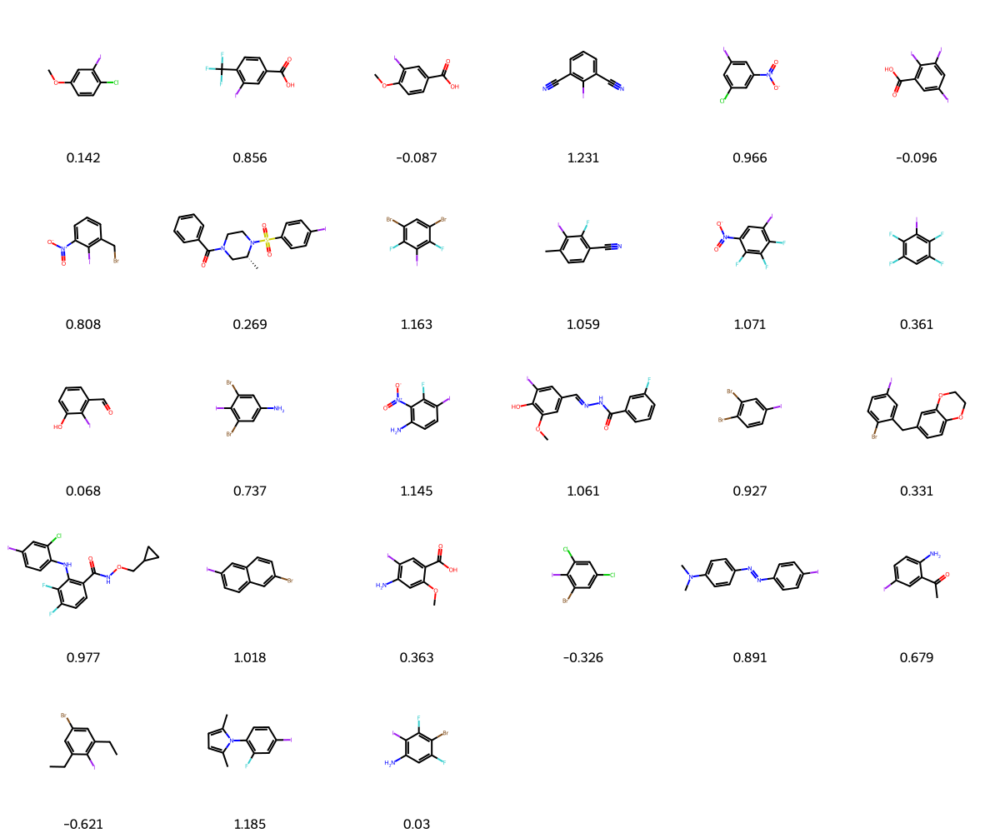

UMAP for Regular BO (EI) (dataset high):

Depicted seed: 4
Scope score: 0.827
Average rate: 0.744
Vendi score: 4.259


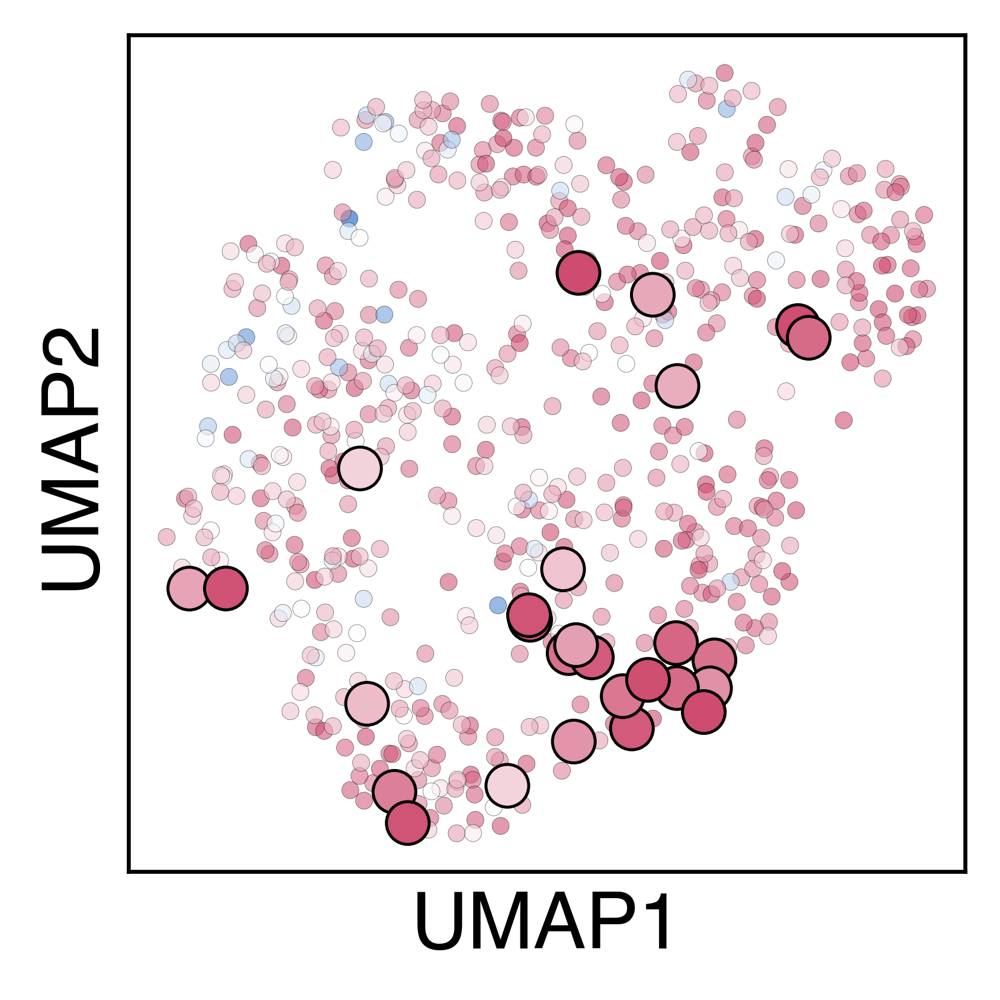

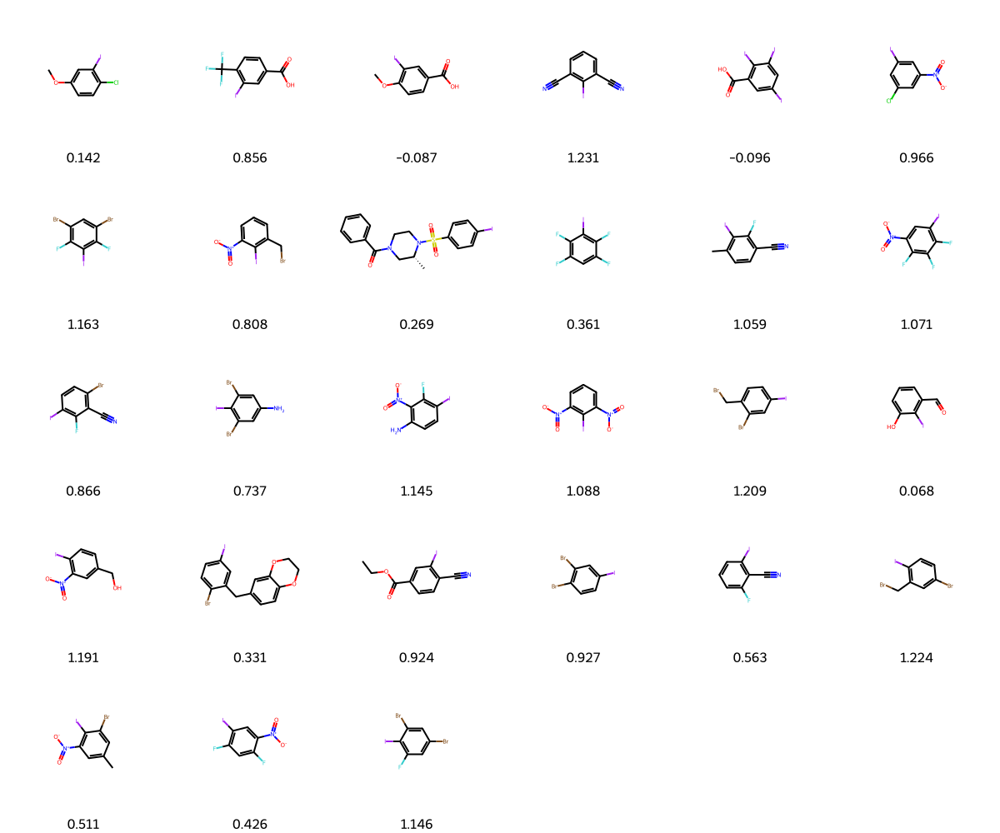

UMAP for conventional selection (dataset high):

Depicted seed: 4
Scope score: 0.305
Average rate: 0.603
Vendi score: 3.648


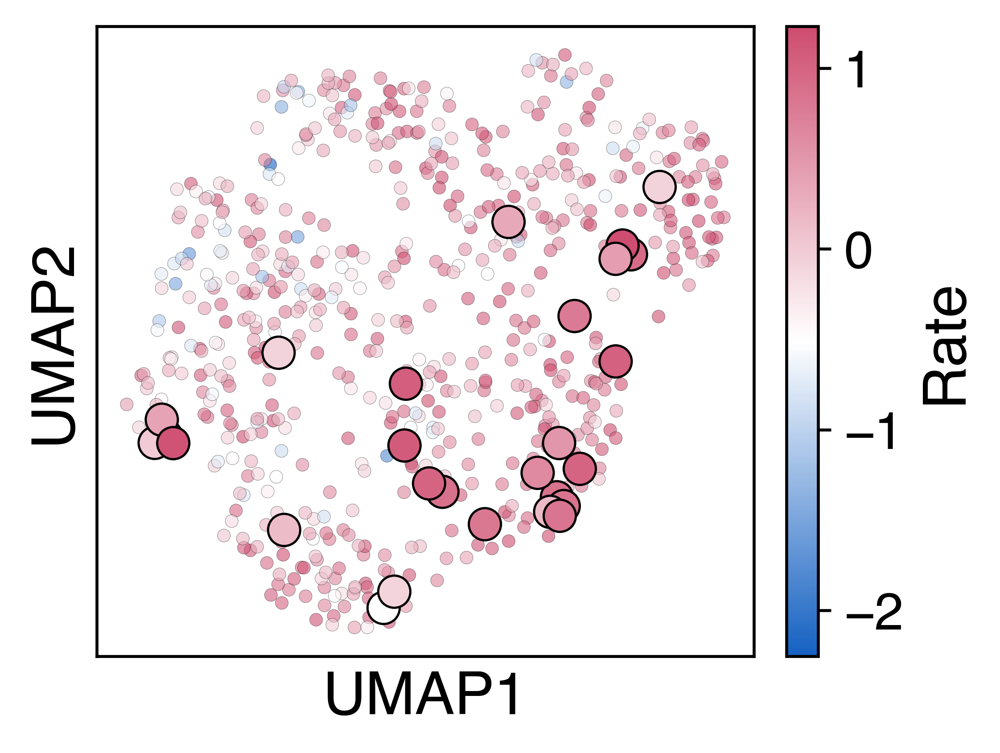

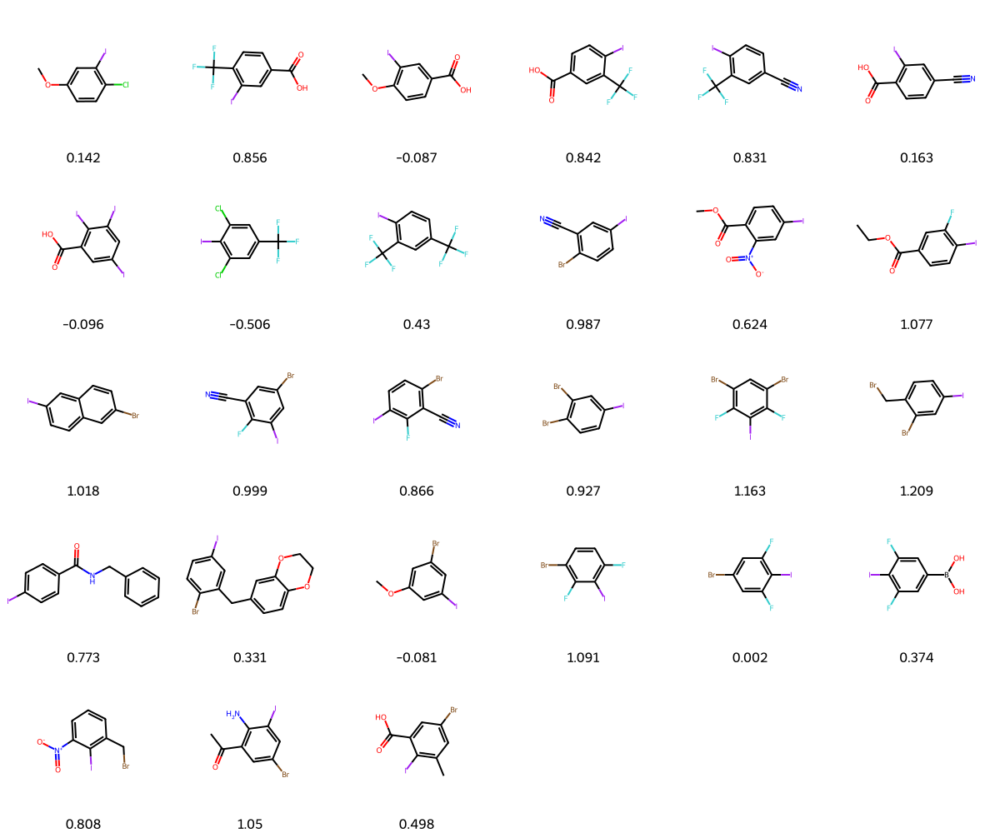

UMAP for ScopeBO (dataset medium):

Depicted seed: 15
Scope score: 0.296
Average rate: 1.557
Vendi score: 4.765


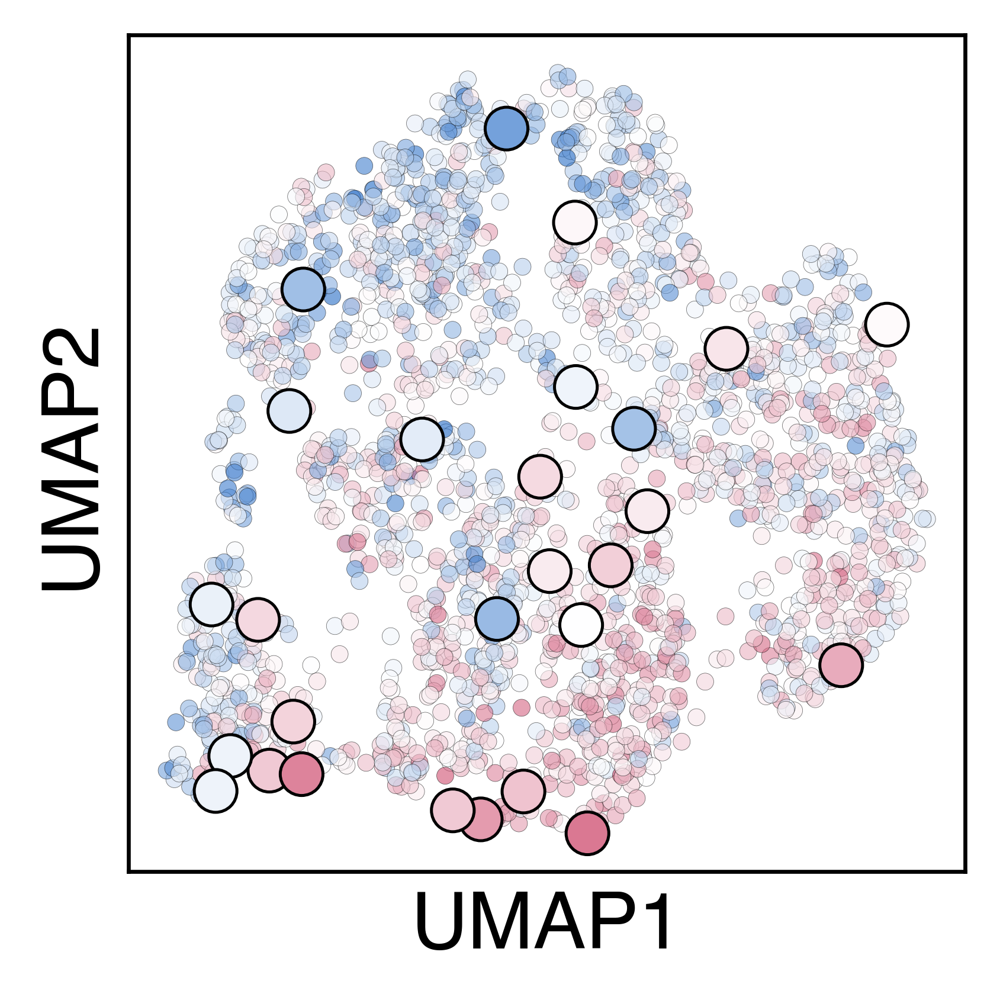

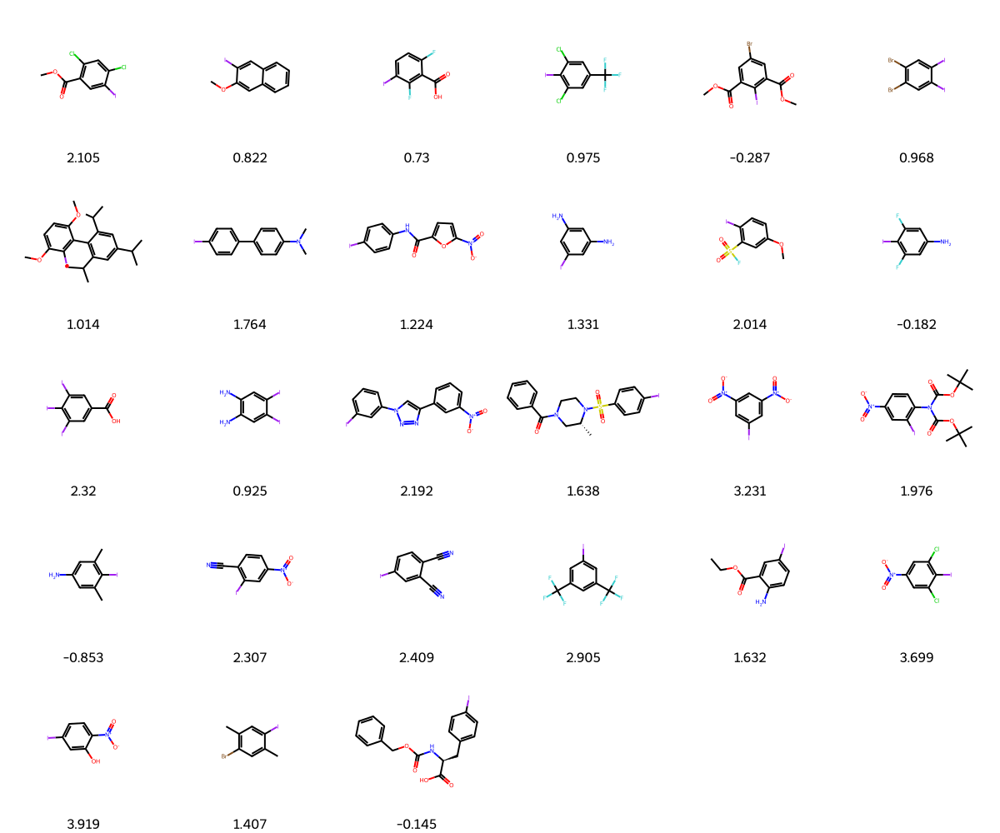

UMAP for Regular BO (EI) (dataset medium):

Depicted seed: 15
Scope score: 0.264
Average rate: 1.605
Vendi score: 4.224


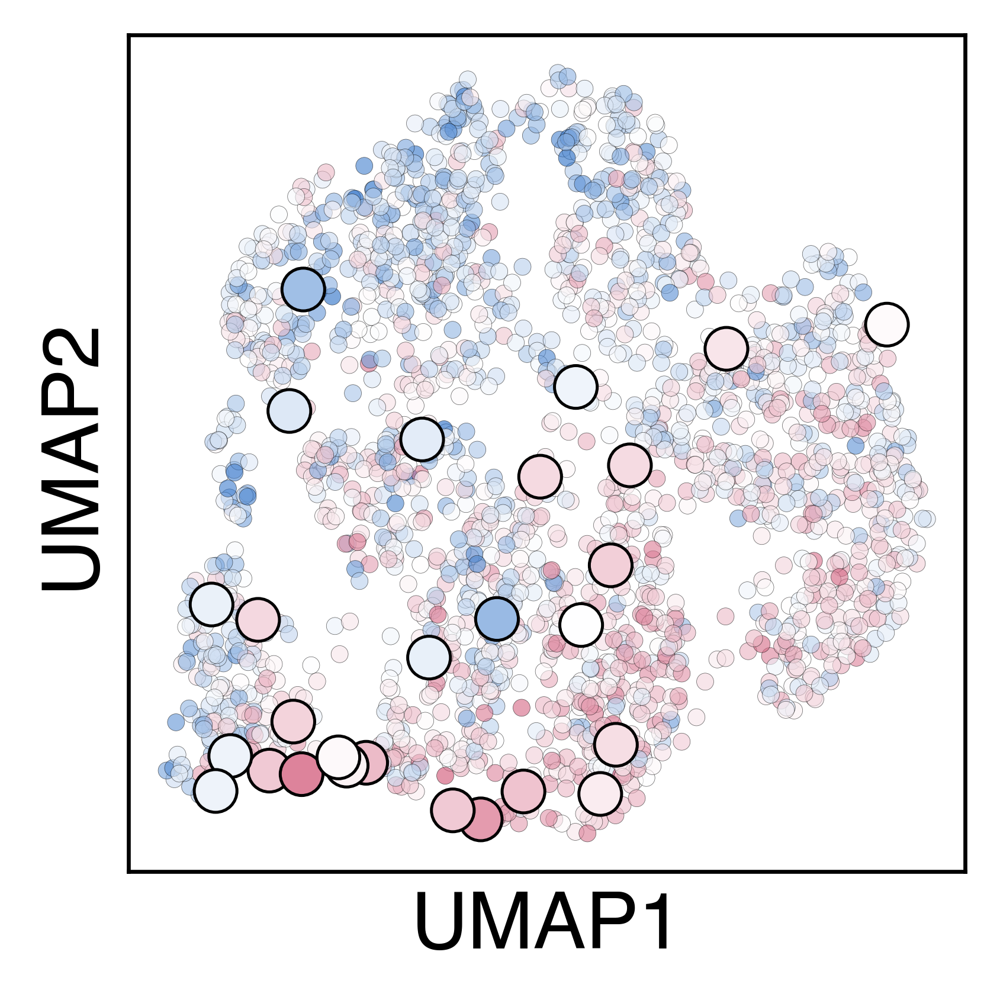

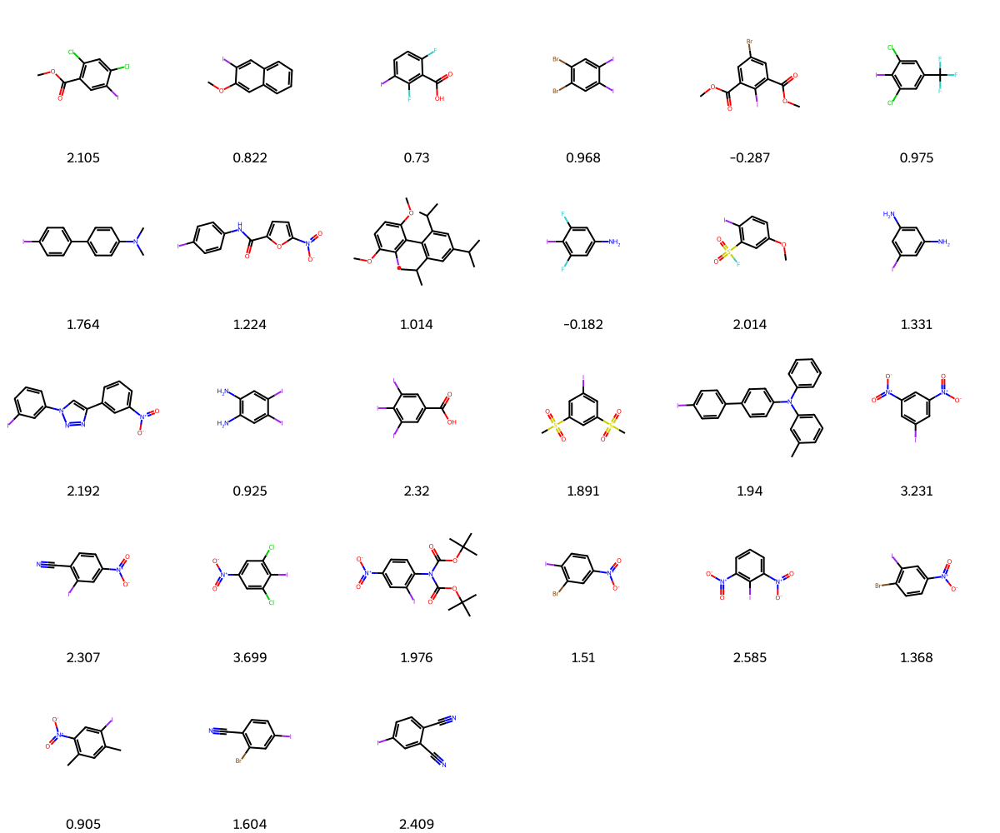

UMAP for conventional selection (dataset medium):

Depicted seed: 15
Scope score: 0.119
Average rate: 1.740
Vendi score: 2.874


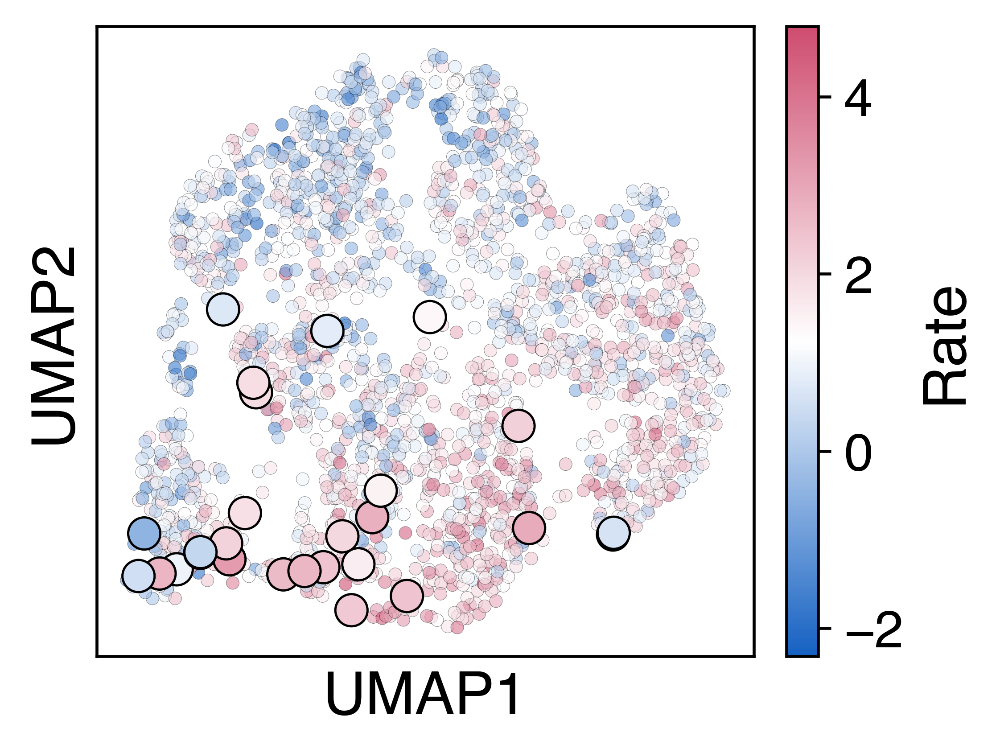

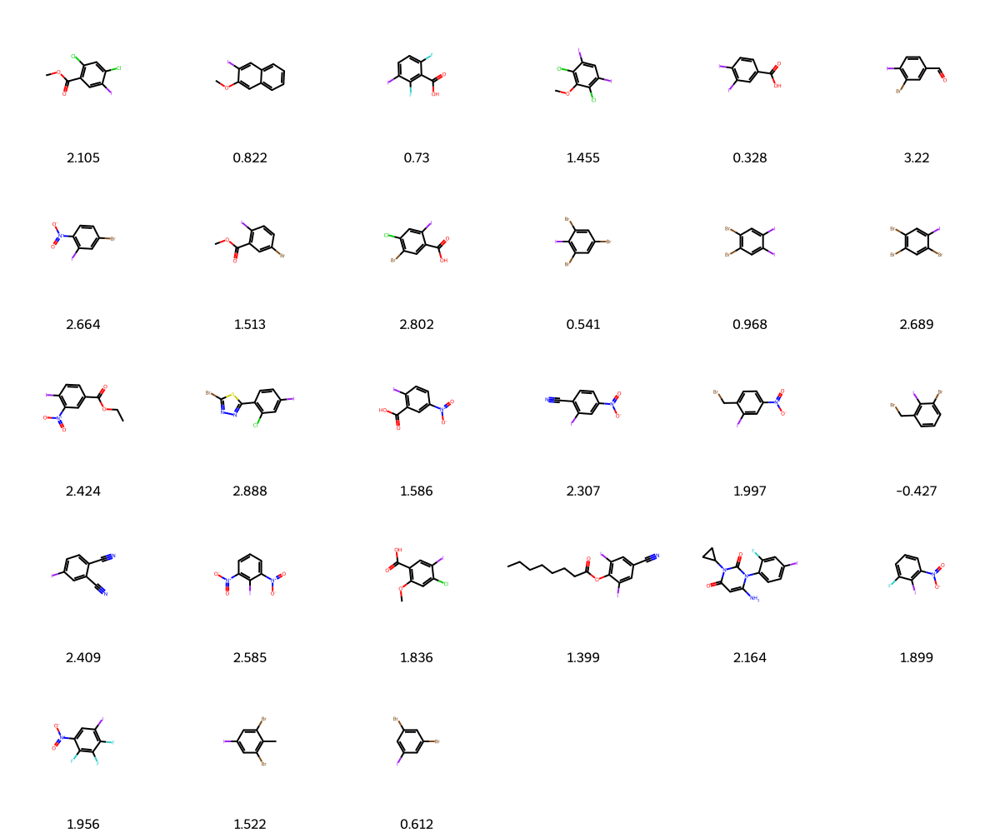

UMAP for ScopeBO (dataset low):

Depicted seed: 13
Scope score: 0.345
Average rate: 2.339
Vendi score: 4.385


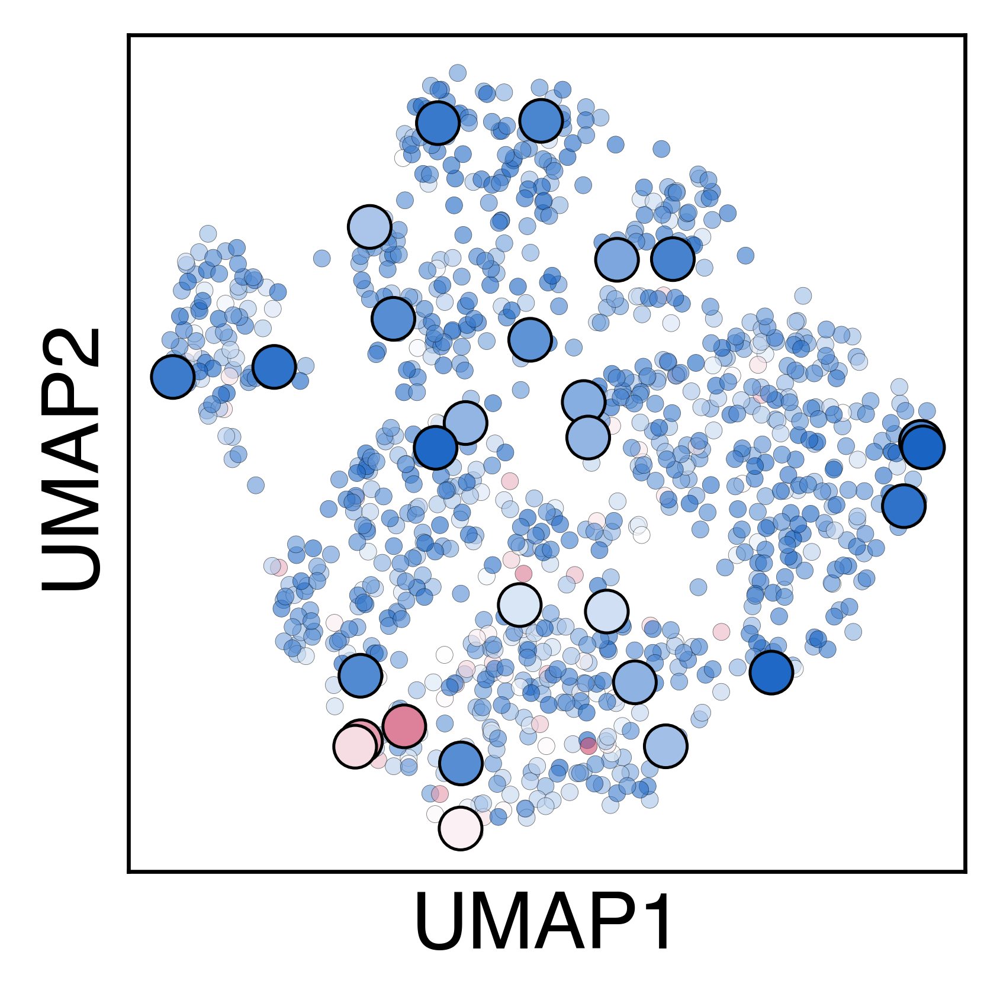

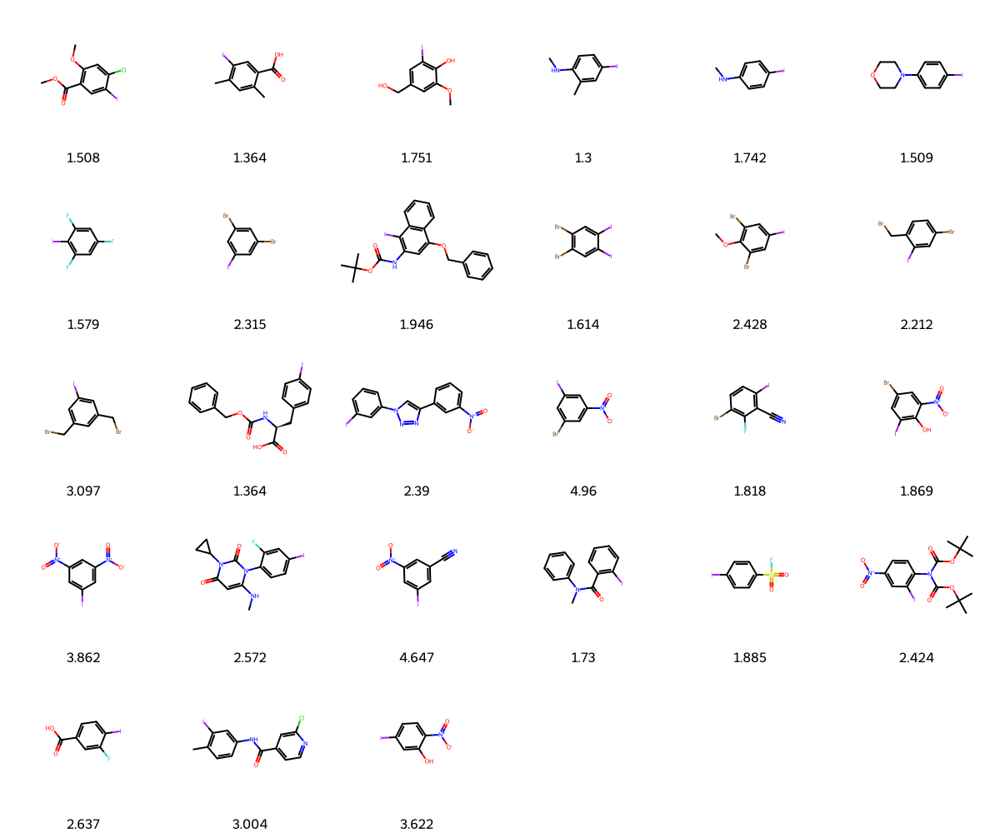

UMAP for Regular BO (EI) (dataset low):

Depicted seed: 13
Scope score: 0.069
Average rate: 2.192
Vendi score: 4.361


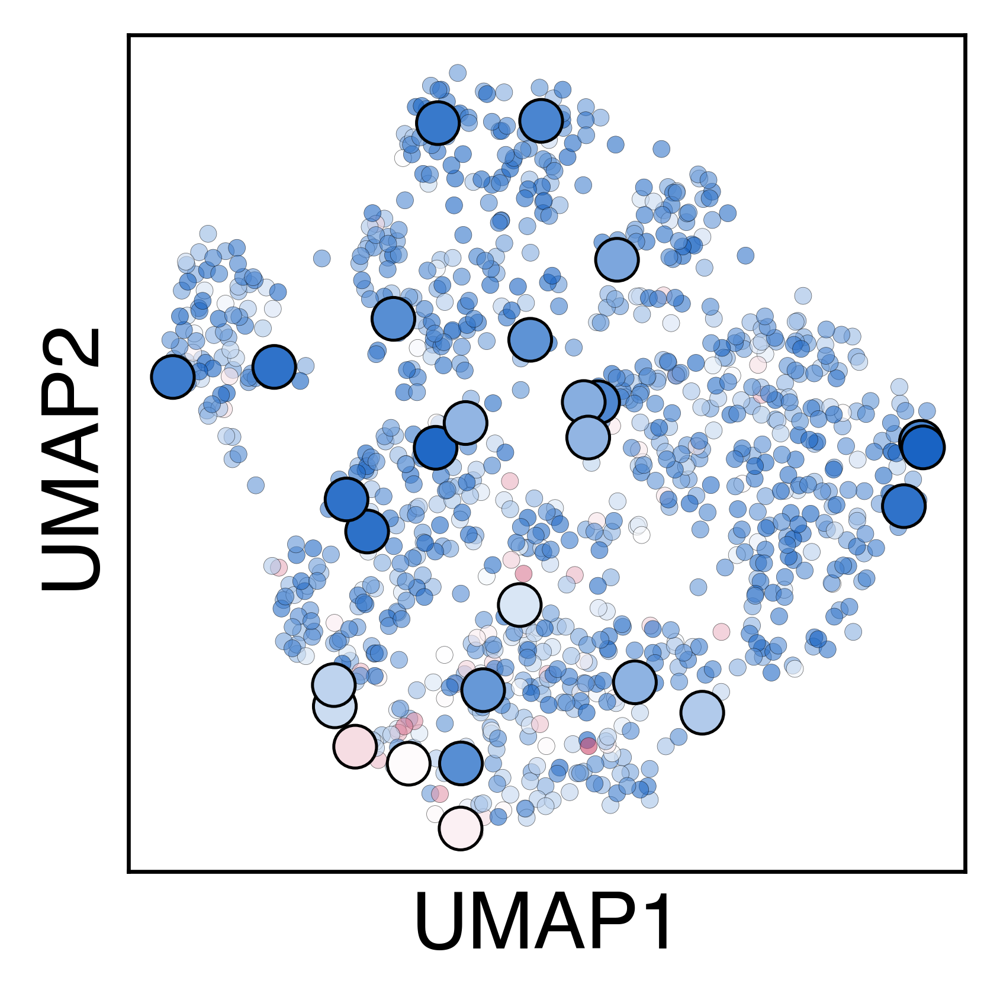

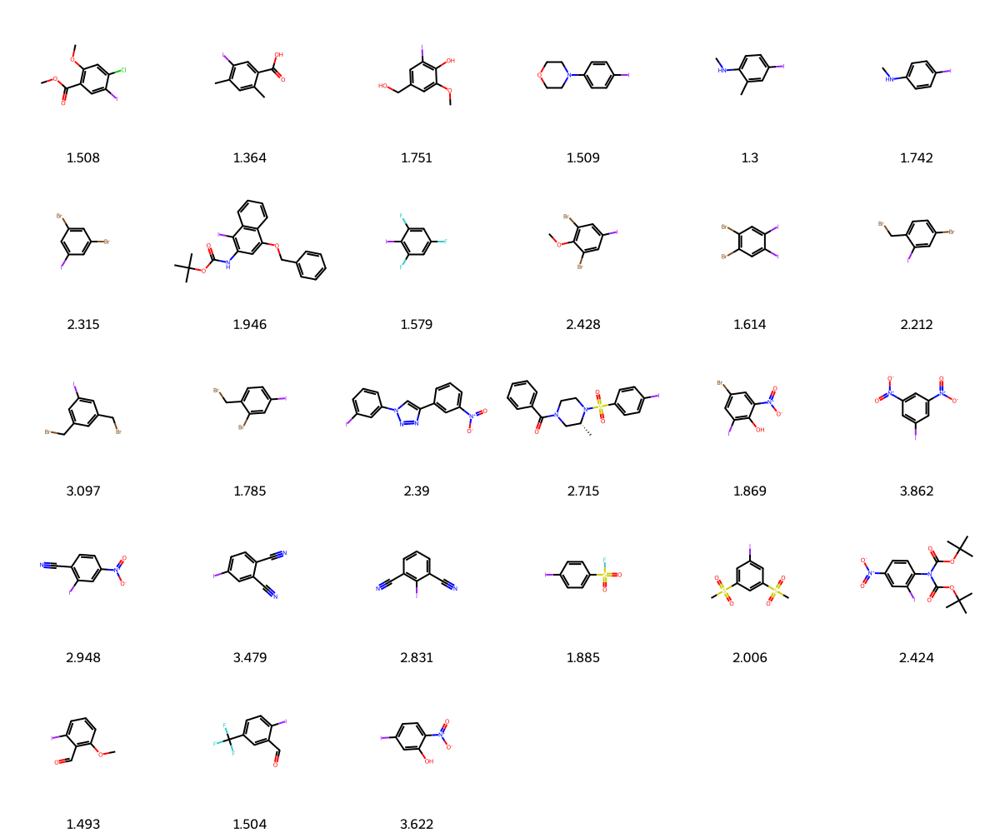

UMAP for conventional selection (dataset low):

Depicted seed: 13
Scope score: 0.080
Average rate: 2.403
Vendi score: 2.446


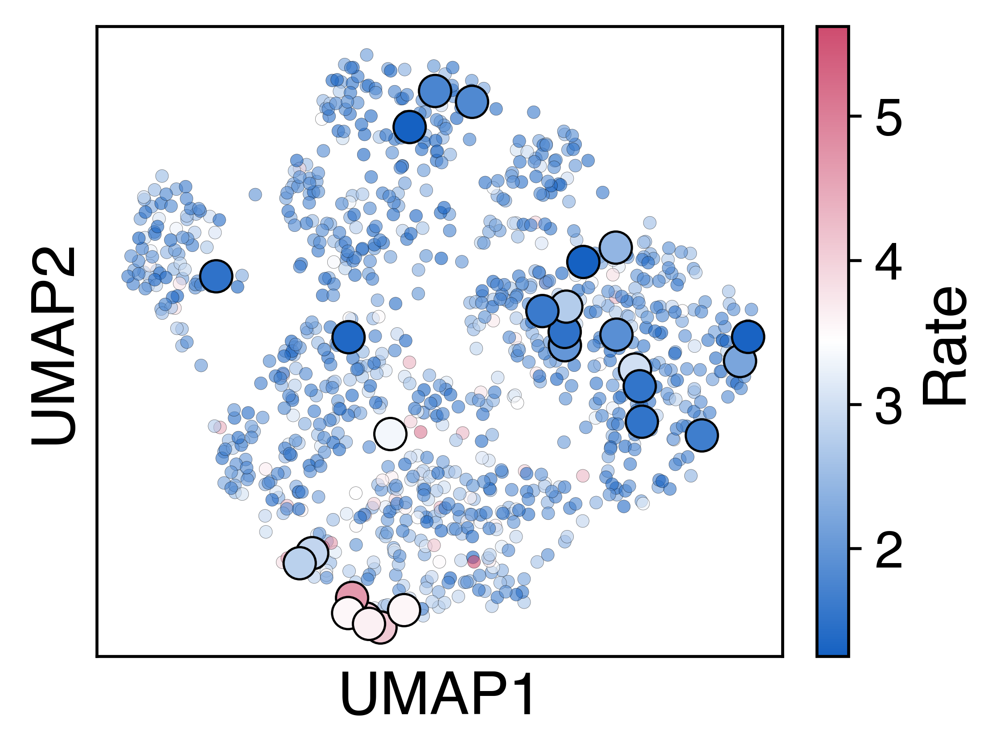

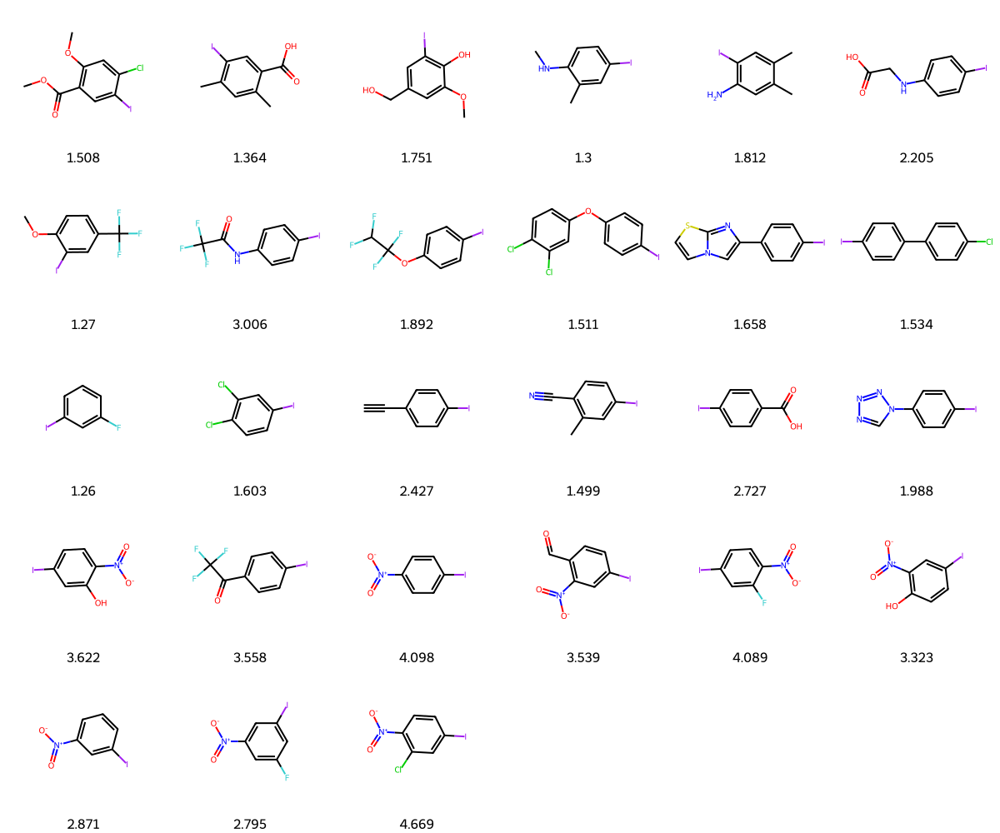

In [24]:
for dset in datasets:
    print(f"UMAP for ScopeBO (dataset {dset}):\n")
    seed = get_umap(name_results=f"./Results_Data/{dset}_dataset/ei_with-pruning",dset = dset, show_colorbar = False, figsize = (2.7, 2.7))
    Benchmark().show_scope(filename_data=f"27balanced_b3_V13_s{seed}.csv", name_results=f"./Results_Data/{dset}_dataset/ei_with-pruning/raw_data/", by_round=False,
                           round_values=3)
    print(f"UMAP for Regular BO (EI) (dataset {dset}):\n")
    get_umap(name_results=f"./Results_Data/{dset}_dataset/ei_no-pruning", dset = dset, hyperpar="balanced_b3_V0", seed=seed, figsize = (2.7, 2.7))
    Benchmark().show_scope(filename_data=f"27balanced_b3_V0_s{seed}.csv", name_results=f"./Results_Data/{dset}_dataset/ei_no-pruning/raw_data/", by_round=False,
                           round_values=3)
    print(f"UMAP for conventional selection (dataset {dset}):\n")
    get_umap(name_results=f"./Results_Data/{dset}_dataset/human-like-acq", hyperpar="greedy_b3_V5", seed = seed, dset = dset, figsize = (3.63, 2.7), show_colorbar=True)
    Benchmark().show_scope(filename_data=f"27greedy_b3_V5_s{seed}.csv", name_results=f"./Results_Data/{dset}_dataset/human-like-acq/raw_data/", by_round=False,
                           round_values=3)